# Neural style transfer

## [![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/ml4a/ml4a-guides/blob/ml4a.net/examples/models/neural_style.ipynb)

Synthesize textures with the style characteristics of an input image, or regenerate one image in the style of another.

The [neural_style module](https://github.com/genekogan/neural_style) is based on [ProGamerGov's PyTorch re-write](https://github.com/ProGamerGov/neural-style-pt) of Justin Johnson's [torch implementation](https://github.com/jcjohnson/neural-style/), which is itself based on the paper by [Gatys et al](https://arxiv.org/abs/1508.06576).


## Set up ml4a and enable GPU

If you don't already have ml4a installed, or you are opening this in Colab, first enable GPU (`Runtime` > `Change runtime type`), then run the following cell to install ml4a and its dependencies.

In [ ]:
%tensorflow_version 1.x
!pip3 install --quiet ml4a

## Run a basic neural style transfer

We import `neural_style` and then create a config which at minimum specifies an input image, output image, image size, and the number of iterations to optimize for.

Note that the GPU memory requirements scale linearly with the number of pixels, and that `neural_style` will crash if you attempt to set the `size` parameter higher than your GPU allows for. 11GB VRAM allows for around 10⁶ pixels. Try increasing your resolution until you run out of memory--this will help you figure out your limits.

Note, remember that doubling the resolution quadruples the number of pixels. You will run out memory very quickly!

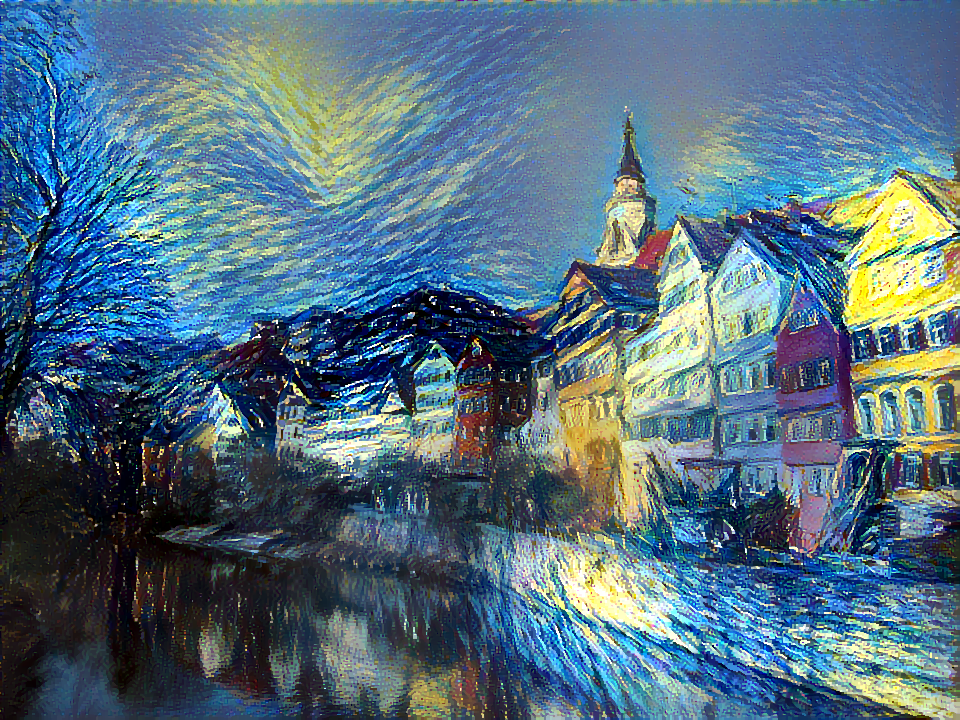

In [1]:
from ml4a import image
from ml4a.models import neural_style

neural_style.params.gpu = '0'
neural_style.params.backend = 'cudnn'

config = {
    'content_image': image.tubingen(),
    'style_image': image.starrynight(),
    'size': 720
}

img = neural_style.run(config)
image.display(img)

## More customized

There are additional parameters to customize: 

* `size`: size of canvas (default 512). Either as tuple `(h, w)` or maximum dimension.
* `style_scale`: At what scale resolution to extract style features fr om style images (deault 1.0)
* `input_image`: Start canvas from another image, rather than from random.
* `num_iterations`: How many steps for the optimization (default 1000)
* `normalize_gradients`: Normalize gradients for each update step
* `original_colors`: Once done, transfer color distribution to that of the content image.

Note that all images, `content_image`, `style_images`, and `input_image` can all be either actual images or paths to saved images on disk.

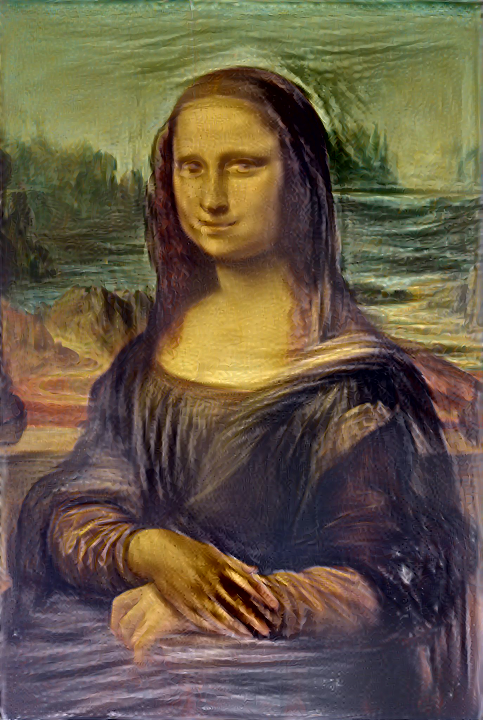

In [4]:

config = {
    'size': 720,
    'content_image': image.monalisa(),
    'style_images': image.scream(),
    'style_scale': 0.5,
    'num_iterations': 800,
    'normalize_gradients': True,
    'original_colors': True
}

img = neural_style.run(config)
image.display(img)

## Multi-scale generation

The `neural_style` module allows for multi-scale generation, where the output image is first initialized and optimized at a low resolution, then upsampled before undergoing more optimization at the higher resolution. This can be repeated several times. For high-resolution outputs, this tends to increase the quality, especially with respect to reconstructing the style images.

To specify multi-scale generation, we need to set the `num_octaves` and `octave_scale` parameters. 

`num_octaves` is the number of resolutions to optimize, and `octave_scale` is the ratio of the upsampling from one "octave" to the next, e.g. 1.5. So for example, if `size`=(720, 480), `num_octaves`=3, and `octave_scale`=2.0, then the multi-scale generation will optimize at canvas sizes (180, 120), (360, 240), and (720, 480), in that order.

Note also that the `num_iterations` and `style_scale` parameters can be set as lists so that those variables can be different at each octave. For example, with `num_octaves`=3, you can set `num_iterations`=[1000, 500, 250], so that it performs 1000 update steps at the lowest resolution, then 500 and 250 at the next two resolutions, respectively. This can be useful because the process is slower when the image is larger, and also needs progressively less refinement. Make sure that the number of octaves matches the length of the list, otherwise you will get an error. If you set `num_iterations` and `style_scale` to single numbers rather than lists, it will use that value for all the octaves.


content, style, output


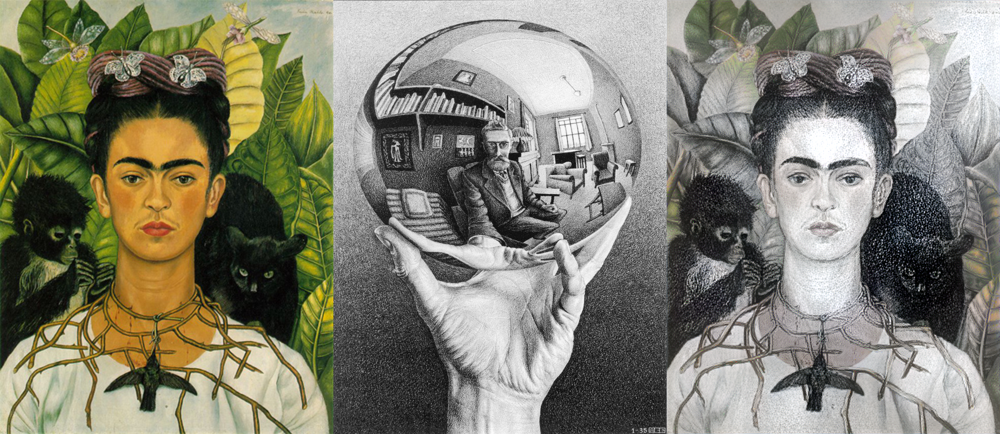

In [5]:
config = {
    'size': 1024,
    'content_image': image.fridakahlo(),
    'style_images': image.escher(),
    'num_iterations': [1000, 750, 500],
    'num_octaves': 3,
    'octave_ratio': 2.0
}

output_image = neural_style.run(config)

output_size = image.get_size(output_image)

image.display([image.fridakahlo(output_size), 
               image.escher(output_size), 
               output_image], 
              title="content, style, output")

# Loss term weights and texture synthesis

Three more parameters to be aware of are `content_weight`, `style_weight`, and `tv_weight`. These modulate the magnitude of the three loss terms the optimizer is attempting to minimize: content reconstruction, style reconstruction, and total variation (TV). TV is a regularizer term which smooths the image by removing high-frequency noise.  

The default values for `content_weight`, `style_weight`, and `tv_weight` are 5.0, 100.0, and 0.001. The absolute magnitude of each of these is not important; what is important is their relative amounts. By setting the ratio of `content_weight`/`style_weight` lower, the optimizer will optimize more towards style reconstruction. Higher prioritizes accurate content reconstruction.

By setting `content_weight` to 0, the content reconstruction loss is zeroed out, and thus the optimizer no longer cares about the content. The resulting output image contains just the style. We refer to this here as "texture synthesis." In this case, we can even remove the content image from the config, and just try to generate a raw texture with a particular style.

The following example illustrates this with Starry Night.

Starry night texture


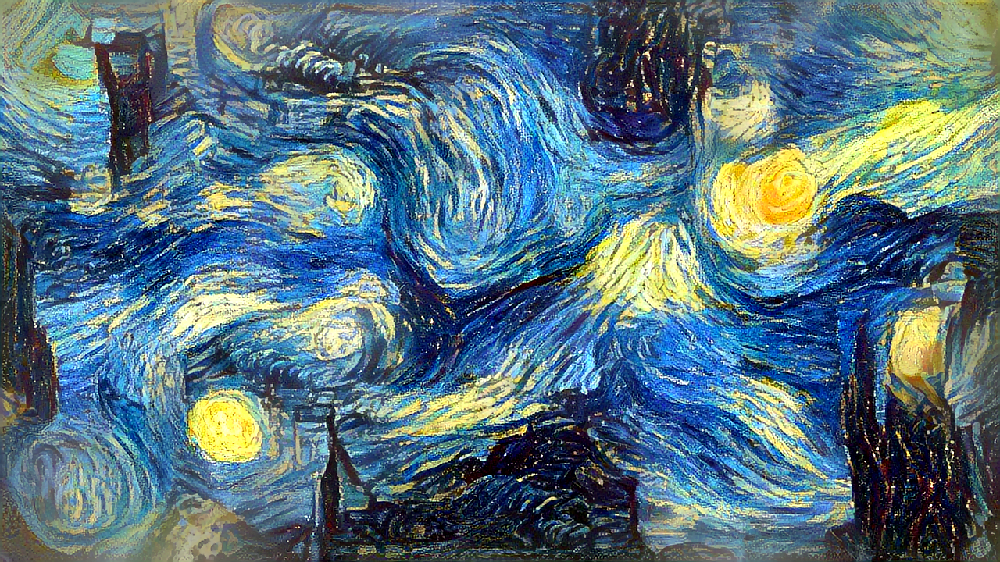

In [10]:
config = {
    'size': (1280, 720),
    'style_images': image.starrynight(),
    'content_weight': 0,
    'num_iterations': [600, 300, 150],
    'num_octaves': 3,
    'octave_ratio': 2.0
}

img = neural_style.run(config)
image.display(img, title="Starry night texture")

## Using masks

Like [deepdream](https://github.com/ml4a/ml4a/blob/ml4a.net/examples/models/deepdream.ipynb), `neural_style` allows you to specify multiple optimization objectives (multiple style images) and regulate them with masks. 

To generate masks, you can use the `ml4a.canvas.mask` class. For more information how to use masks, see the [masks example](https://github.com/ml4a/ml4a/blob/ml4a.net/examples/canvas/masks.ipynb).

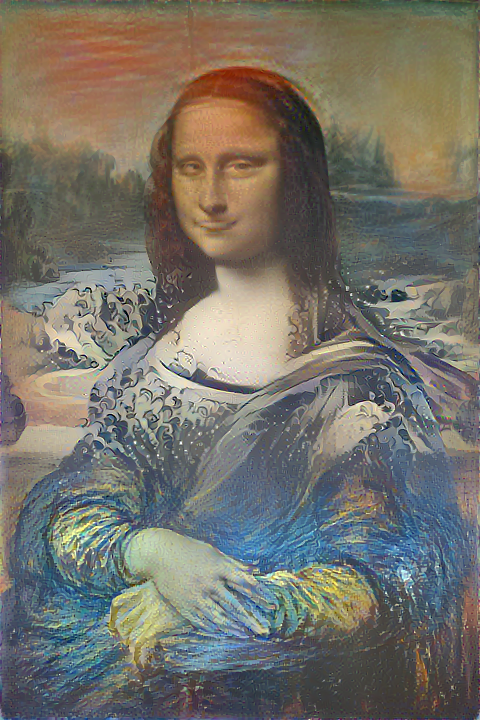

In [11]:
from ml4a.canvas import mask

size = (480, 720)

mask_config = {
    'type': 'rects',
    'size': size, 
    'num_channels': 3, 
    'p1': (0.0, 0.5), 
    'p2': (1.0, 0.5), 
    'width': 3.0, 
    'blend': 0.0
}

config = {
    'size': size,
    'content_image': image.monalisa(), 
    'style_images': [image.starrynight(), image.hokusai(), image.scream()],
    'content_masks': mask.get_mask(mask_config),
    'style_scale': 1.0,
    'num_iterations': [800, 400],
    'num_octaves': 2,
    'octave_ratio': 2.0
}

img = neural_style.run(config)
image.display(img)


The results are pretty good, but become a bit muddy around the border regions between styles, with grayish desaturated regions where the masks meet. Neural style transfer does not seem to blend the features of different style images as well as deepdream does, and it's an open question how to improve this. 

Changing the style representation can help, as `neural_style` uses a Gram matrix as a style statistic, and this is a known problem for Gram matrices. [One paper](https://arxiv.org/abs/2006.07229) has suggested using sliced Wasserstein distance for improved quality, and this could be a good addition to the [neural_style repository](https://github.com/genekogan/neural_style). 

# Masking with BASNet

You can also try using BASNet ([`ml4a.models.basnet`](https://github.com/ml4a/ml4a/blob/master/examples/models/BASNet.ipynb)) to generate a 2-channel mask using foreground/background segmentation. If we use the same input image for neural stlye as we use to generate the mask, we can apply different styles to the foreground and background.

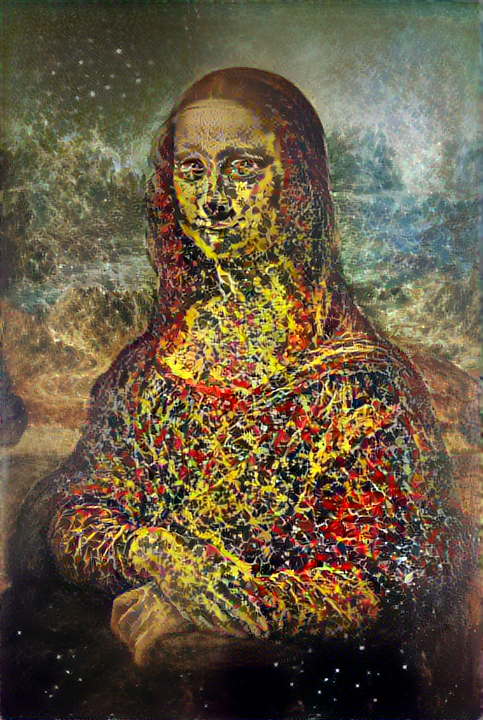

In [12]:
from ml4a.models import basnet
from ml4a.canvas import mask

img0 = image.monalisa()
img0_fg = basnet.get_foreground(img0)

config = {
    'size': 720,
    'content_image': img0, 
    'style_images': ["https://upload.wikimedia.org/wikipedia/commons/thumb/0/00/Crab_Nebula.jpg/1200px-Crab_Nebula.jpg",
                     "https://i.pinimg.com/originals/95/39/4b/95394b91a920e8c9014bac8eb25056d9.jpg"],
    'content_masks': [mask.mask_to_image(1.0-img0_fg/255.0), 
                      mask.mask_to_image(img0_fg/255.0)],
    'style_scale': 1.0,
    'num_iterations': [800, 500, 250],
    'num_octaves': 3,
    'octave_ratio': 1.75,
    'original_colors': False
}

img = neural_style.run(config)
image.display(img)

Like in the first mask example, the border regions are a bit muddy, and in general, the style reconstruction of each style seems to suffer when multiple styles are used. It is a high priority to try to improve this in the [neural_style repository](https://github.com/genekogan/neural_style). 